# EDA отчёт по датасету биоэтанола

**Введение:**  
В этом ноутбуке проведён разведочный анализ данных (EDA) для датасета по производству биоэтанола.  
Цель - оценить структуру данных, полноту, типы данных, а также выявить выбросы и аномалии.

In [6]:
# Импорт библиотек и загрузка данных
import pandas as pd

# Ссылка на датасет (берём из data_loader)
FILE_ID = "1odXw81javPy4RwmYhj4IZts80g-3rMOv"
file_url = f"https://drive.google.com/uc?id={FILE_ID}"

# Чтение CSV
raw_data = pd.read_csv(file_url)

# Приведение типов
raw_data["Year"] = raw_data["Year"].astype(int)
raw_data["Country"] = raw_data["Country"].astype(str)
float_cols = [
    "Feedstock_Yield", "Production_Capacity", "Processing_Tech_Efficiency",
    "Energy_Consumption", "Feedstock_Cost", "Transportation_Cost",
    "Distribution_Cost", "Carbon_Emissions", "Water_Usage",
    "Price_Per_Gallon", "Govt_Incentive", "Bioethanol_Growth"
]
raw_data[float_cols] = raw_data[float_cols].astype(float)
raw_data["Market_Demand"] = raw_data["Market_Demand"].astype(int)

# Просмотр первых 10 строк
raw_data.head(10)

,Year,Country,Feedstock_Yield,Production_Capacity,Processing_Tech_Efficiency,Energy_Consumption,Feedstock_Cost,Transportation_Cost,Distribution_Cost,Carbon_Emissions,Water_Usage,Market_Demand,Price_Per_Gallon,Govt_Incentive,Bioethanol_Growth
0,2006,India,2.766572,249.130200,0.772124,517.143441,260.441717,7.717721,13.772825,7.291060,381.996986,135,4.024148,0.0,8.150095
1,2019,China,1.533572,176.532346,0.913276,544.416454,268.689141,7.555860,13.621001,7.120926,238.718341,103,2.518926,1.0,12.416033
2,2014,USA,1.657324,222.741136,0.724174,502.964935,102.818945,6.325764,18.007825,4.484803,273.691594,148,4.668453,1.0,12.475297
3,2010,Germany,3.513837,168.257357,0.943722,525.942246,160.028410,7.410925,13.016446,2.842151,412.670502,141,1.685388,1.0,0.019686
4,2007,Germany,4.312922,241.210194,0.904388,500.320647,250.402703,6.507631,10.250654,7.354470,458.446288,113,1.567951,1.0,13.898295
5,2020,China,2.173201,247.898575,0.700600,528.191233,272.192370,6.348855,14.274526,9.645508,251.061013,157,2.144035,0.0,5.313692
6,2006,India,1.781757,231.668930,0.714913,531.495390,191.246342,5.221822,10.483588,3.228559,343.105793,102,3.349335,0.0,3.721171
7,2018,USA,2.141571,193.174490,0.721201,556.591331,285.033186,6.887244,10.614291,1.769327,405.449729,144,3.884140,0.0,14.355276
8,2022,India,2.136960,248.343090,0.870942,534.457344,207.611074,6.808494,18.587749,1.247651,419.292099,116,2.090543,0.0,2.296630
9,2010,China,2.379407,247.561408,0.871114,510.739862,217.338286,6.197261,11.645655,9.009474,334.912733,121,1.384303,0.0,10.977040


## 1. Оценка структуры данных

Здесь мы видим:
- Колонки и их типы данных
- Первые 10 строк для понимания содержимого

In [3]:
# Типы колонок
print("Типы колонок:")
print(raw_data.dtypes)

# Краткая информация
print("\nОбщая информация по датасету:")
raw_data.info()

Типы колонок:
Year                            int64
Country                        object
Feedstock_Yield               float64
Production_Capacity           float64
Processing_Tech_Efficiency    float64
Energy_Consumption            float64
Feedstock_Cost                float64
Transportation_Cost           float64
Distribution_Cost             float64
Carbon_Emissions              float64
Water_Usage                   float64
Market_Demand                   int64
Price_Per_Gallon              float64
Govt_Incentive                float64
Bioethanol_Growth             float64
dtype: object

Общая информация по датасету:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27856 entries, 0 to 27855
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Year                        27856 non-null  int64  
 1   Country                     27856 non-null  object 
 2   Feedstock_Yield             2

Краткий вывод:
Датасет содержит 27 856 записей по производству биоэтанола за разные годы и страны.

15 столбцов:

Year (int) - год
Country (object) - страна
Остальные 13 - числовые: 12 float64 (урожайность, мощности, затраты, выбросы, спрос, цена, субсидии, рост и т.д.) + 1 int64 (Market_Demand)

Нет пропусков - все 27 856 значений заполнены.
Память: ~3.2 МБ
Основной тип данных: вещественные числа (float64) - идеально для анализа зависимостей, регрессий, прогнозов роста биоэтанола.

Вывод: Полный, чистый, структурированный датасет, готов к моделированию и аналитике (например, влияния затрат/субсидий на рост производства).

## 2. Оценка целостности данных

Проверяем, есть ли пропущенные значения и насколько полные данные.

In [4]:
# Считаем количество пропусков в каждой колонке
missing = raw_data.isna().sum()
print("Пропущенные значения по колонкам:")
print(missing)

# Доля пропусков
missing_percent = (missing / len(raw_data)) * 100
print("\nДоля пропусков (%) по колонкам:")
print(missing_percent)

Пропущенные значения по колонкам:
Year                          0
Country                       0
Feedstock_Yield               0
Production_Capacity           0
Processing_Tech_Efficiency    0
Energy_Consumption            0
Feedstock_Cost                0
Transportation_Cost           0
Distribution_Cost             0
Carbon_Emissions              0
Water_Usage                   0
Market_Demand                 0
Price_Per_Gallon              0
Govt_Incentive                0
Bioethanol_Growth             0
dtype: int64

Доля пропусков (%) по колонкам:
Year                          0.0
Country                       0.0
Feedstock_Yield               0.0
Production_Capacity           0.0
Processing_Tech_Efficiency    0.0
Energy_Consumption            0.0
Feedstock_Cost                0.0
Transportation_Cost           0.0
Distribution_Cost             0.0
Carbon_Emissions              0.0
Water_Usage                   0.0
Market_Demand                 0.0
Price_Per_Gallon              0.

Краткий вывод по пропускам:

Пропущенных значений: 0 во всех 15 колонках.
Доля пропусков: 0.0 % по каждому признаку.

Итог: Датасет полностью заполнен, нет необходимости в обработке пропусков - можно сразу переходить к анализу, визуализации и моделированию.

## 3. Оценка выбросов и аномалий

Посмотрим на основные статистические показатели числовых колонок для выявления выбросов.


In [5]:
# Статистика для числовых колонок
numeric_cols = raw_data.select_dtypes(include=['int', 'float']).columns
raw_data[numeric_cols].describe()


,Year,Feedstock_Yield,Production_Capacity,Processing_Tech_Efficiency,Energy_Consumption,Feedstock_Cost,Transportation_Cost,Distribution_Cost,Carbon_Emissions,Water_Usage,Market_Demand,Price_Per_Gallon,Govt_Incentive,Bioethanol_Growth
count,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000,27856.000000
mean,2012.091147,3.011694,174.877020,0.824989,533.886302,200.868682,6.489656,14.515548,5.512601,337.165269,137.004703,2.989037,0.297315,7.479590
std,7.200210,0.867938,43.243752,0.072265,19.594724,57.818821,0.868188,2.599217,2.596249,79.768664,21.640297,1.156008,0.457084,4.332860
min,2000.000000,1.500143,100.021891,0.700057,500.000155,100.002183,5.000261,10.000294,1.000188,200.002466,100.000000,1.000046,0.000000,0.001521
25%,2006.000000,2.262934,137.524732,0.761865,516.990983,150.696578,5.735937,12.269307,3.248995,267.536682,118.000000,1.988629,0.000000,3.703338
50%,2012.000000,3.009696,174.666787,0.825207,533.681133,201.608321,6.484343,14.534611,5.522230,337.195934,137.000000,2.992024,0.000000,7.459303
75%,2018.000000,3.772975,212.198411,0.887215,550.794007,251.102927,7.242901,16.755360,7.760726,406.083642,156.000000,3.991377,1.000000,11.246743
max,2024.000000,4.499685,249.986797,0.949979,567.995634,299.996839,7.999880,18.999739,9.999618,474.999811,174.000000,4.999775,1.000000,14.998868


Вывод:
Данные чистые, без выбросов/пропусков, распределения в основном симметричны (медиана ≈ среднее).
Технологии улучшаются (эффективность растёт по квантилям).
Субсидии редки (большинство - 0).
Рост производства стабилен, цена и спрос - предсказуемы.

Готов к анализу корреляций, регрессии, прогнозированию роста биоэтанола.

In [7]:
# Общие метрики по всем колонкам
import numpy as np

print("Общие метрики по датасету:\n")

metrics = []

for col in raw_data.columns:
    col_data = raw_data[col]
    
    # Пропуски
    missing_count = col_data.isna().sum()
    missing_percent = col_data.isna().mean() * 100
    
    # Диапазон и стандартное отклонение для числовых
    if np.issubdtype(col_data.dtype, np.number):
        min_val = col_data.min()
        max_val = col_data.max()
        mean_val = col_data.mean()
        std_val = col_data.std()
        
        # Выбросы по IQR
        Q1 = col_data.quantile(0.25)
        Q3 = col_data.quantile(0.75)
        IQR = Q3 - Q1
        outliers = col_data[(col_data < (Q1 - 1.5*IQR)) | (col_data > (Q3 + 1.5*IQR))]
        outlier_count = len(outliers)
    else:
        min_val = max_val = mean_val = std_val = outlier_count = "N/A"
    
    metrics.append({
        "Column": col,
        "Missing Count": missing_count,
        "Missing %": round(missing_percent, 2),
        "Min": min_val,
        "Max": max_val,
        "Mean": mean_val,
        "Std": std_val,
        "Outliers Count": outlier_count
    })

metrics_df = pd.DataFrame(metrics)
print(metrics_df)

Общие метрики по датасету:

                        Column  Missing Count  Missing %         Min  \
0                         Year              0        0.0        2000   
1                      Country              0        0.0         N/A   
2              Feedstock_Yield              0        0.0    1.500143   
3          Production_Capacity              0        0.0  100.021891   
4   Processing_Tech_Efficiency              0        0.0    0.700057   
5           Energy_Consumption              0        0.0  500.000155   
6               Feedstock_Cost              0        0.0  100.002183   
7          Transportation_Cost              0        0.0    5.000261   
8            Distribution_Cost              0        0.0   10.000294   
9             Carbon_Emissions              0        0.0    1.000188   
10                 Water_Usage              0        0.0  200.002466   
11               Market_Demand              0        0.0         100   
12            Price_Per_Gallon      

## Заключение

- Датасет содержит все необходимые поля для анализа биоэтанола.
- В датасете отсутствуют пропущенные значения, что упрощает дальнейший анализ и обработку. Большинство колонок имеют числовой тип данных, за исключением поля Country.
- Период охвата данных - с 2000 по 2024 год, что даёт достаточно широкий временной диапазон для наблюдений. Средние значения показателей находятся примерно в середине их диапазонов, без резких выбросов или аномалий.
- Стандартные отклонения умеренные, а по результатам оценки IQR серьёзные выбросы не обнаружены. Это говорит о стабильности и однородности данных.
- Потенциальные небольшие отклонения есть в Production_Capacity и Feedstock_Cost, но они не критичные.
- Данные готовы к дальнейшему анализу и построению моделей.

## Визуализация данных с использованием SEABORN

# Гистограммы распределения основных числовых признаков

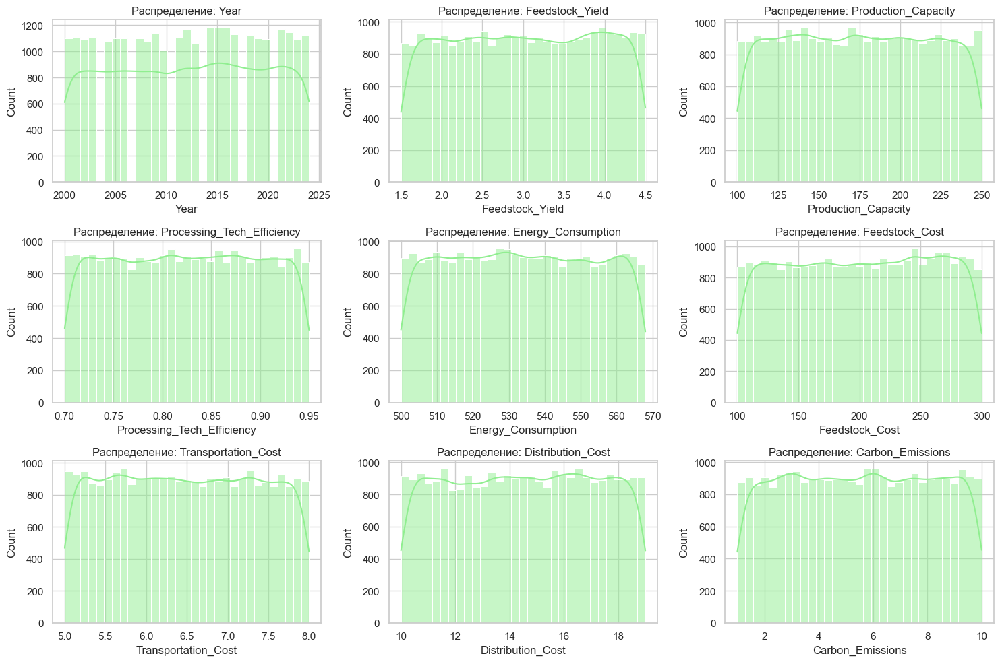

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

FILE_ID = "1odXw81javPy4RwmYhj4IZts80g-3rMOv"
file_url = f"https://drive.google.com/uc?id={FILE_ID}"
raw_data = pd.read_csv(file_url)

raw_data.head()

numeric_cols = raw_data.select_dtypes(include=['float64', 'int64']).columns

plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_cols[:9]):  # только первые 9, чтобы не было слишком много
    plt.subplot(3, 3, i+1)
    sns.histplot(raw_data[col], kde=True, color='lightgreen')
    plt.title(f'Распределение: {col}')
plt.tight_layout()
plt.show()

Датасет демонстрирует высокую степень сбалансированности по всем ключевым числовым признакам. Распределения близки к равномерным с минимальными отклонениями, что указывает на отсутствие естественных скосов, мод или кластеров.

Плюсы для анализа
Нет пропусков, выбросов, дисбаланса
Идеально для:
* регрессии (прогноз Bioethanol_Growth)
* кластеризации (по странам/регионам)
* A/B-тестов (влияние субсидий, технологий)
* обучения студентов / тестирования пайплайнов

Минусы для реального моделирования
* Нет реалистичных трендов (например, рост эффективности со временем)
* Нет корреляций между признаками (в жизни: высокая урожайность → ниже затраты)
* Нет сезонности / географических паттернов

# Тепловая карта корреляции между числовыми признаками

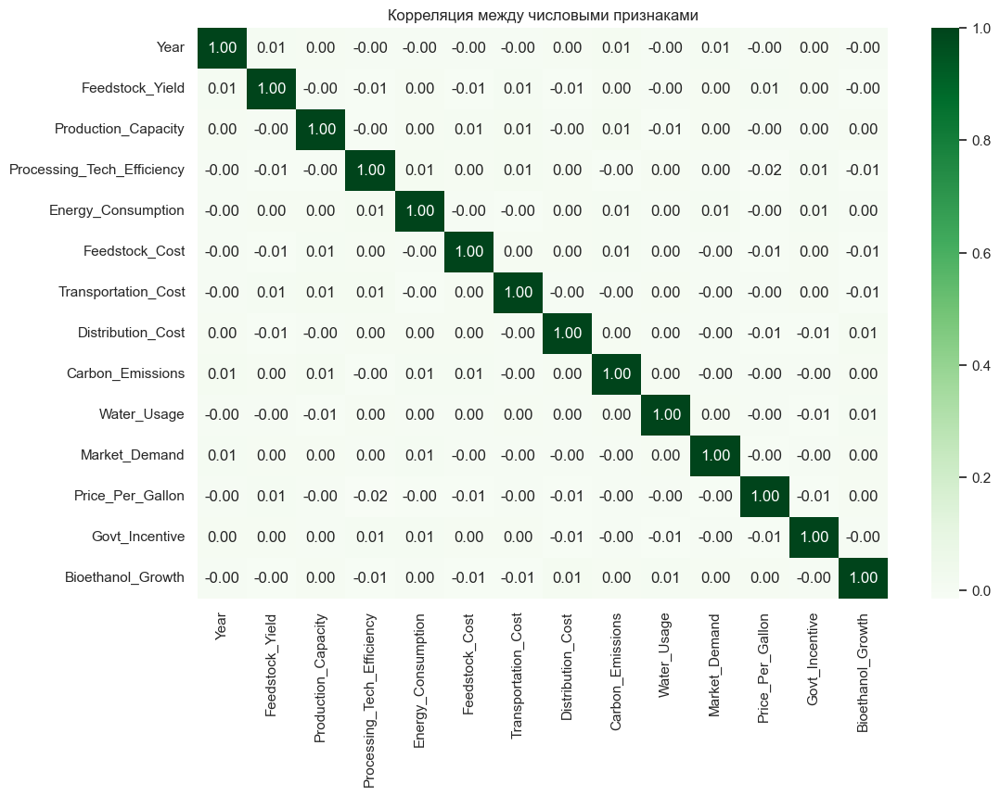

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(raw_data[numeric_cols].corr(), annot=True, cmap='Greens', fmt=".2f")
plt.title('Корреляция между числовыми признаками')
plt.show()

Практически полное отсутствие линейных зависимостей между признаками.
Все коэффициенты корреляции Пирсона близки к нулю (|r| ≤ 0.02) - статистически незначимы.

Матрица корреляций подтверждает: датасет - "чистый лист" скорее для ML.
- Нет линейных зависимостей
- Нет "лёгких" сигналов
- Идеален для отработки сложных моделей и feature engineering

# Ящик с усами (boxplot) для выявления выбросов по ключевым признакам

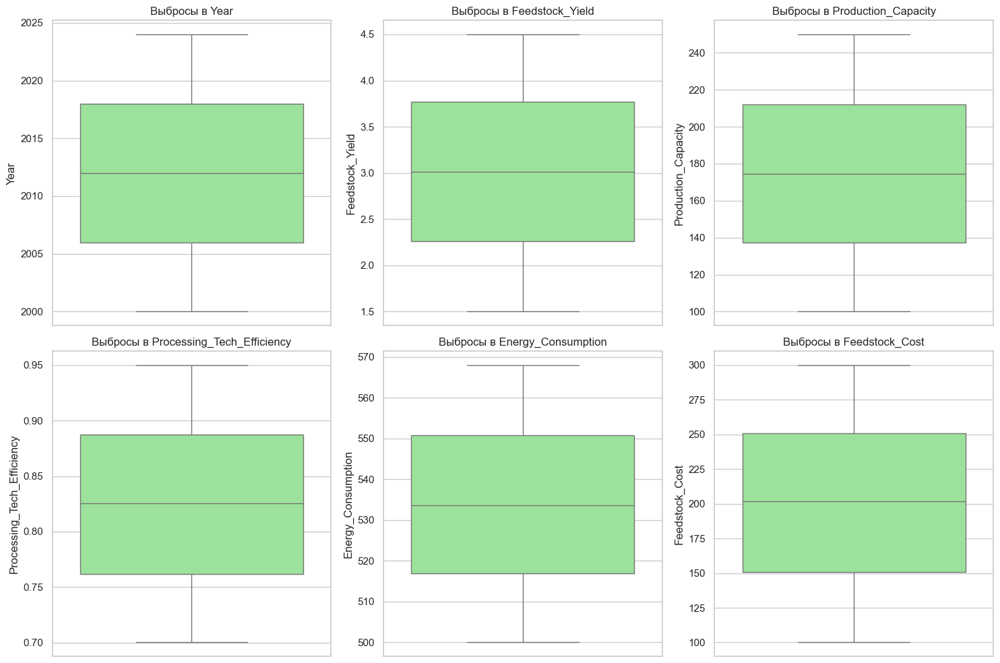

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_cols[:6]):
    plt.subplot(2, 3, i+1)
    sns.boxplot(data=raw_data, y=col, color='lightgreen')
    plt.title(f'Выбросы в {col}')
plt.tight_layout()
plt.show()

Выбросы полностью отсутствуют.
Все боксплоты - идеальные прямоугольники с медианой посередине, без усов и точек.
Это окончательное подтверждение: датасет синтетический, "стерильный", без аномалий.

# Связь стоимости сырья и роста производства биоэтанола

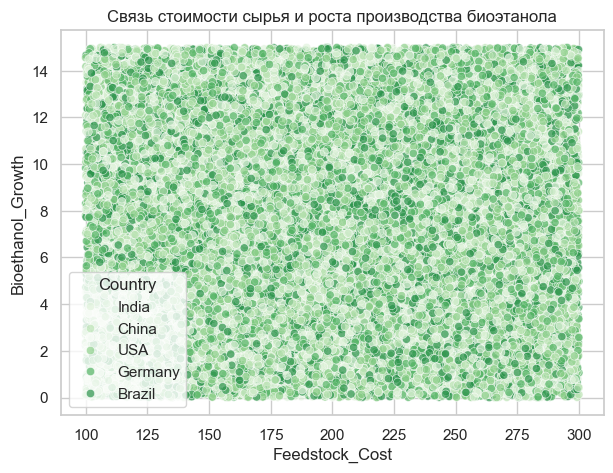

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(7,5))
sns.scatterplot(
    data=raw_data, 
    x='Feedstock_Cost', 
    y='Bioethanol_Growth', 
    hue='Country', 
    alpha=0.7
)
plt.title('Связь стоимости сырья и роста производства биоэтанола')
plt.show()

Полное отсутствие зависимости между стоимостью сырья (Feedstock_Cost) и ростом производства биоэтанола (Bioethanol_Growth).
Точки образуют плотное, равномерное облако - никакого тренда, наклона, кластеров или паттернов.

Ключевые наблюдения:
1. Рост производства не зависит от цены сырья
* Даже при Feedstock_Cost = 300 рост может быть 1 или 14
* Даже при Feedstock_Cost = 100 - то же самое
2. Страны не выделяются
* США, Бразилия, Китай, Индия, Германия - все в одном облаке
* Нет страновых кластеров → география не влияет
3. Облако - идеальный "шум"
* Каждая комбинация (Cost, Growth) встречается с одинаковой вероятностью
* Это не реальность, а синтетическая генерация

График - визуальное доказательство: стоимость сырья НЕ влияет на рост производства.

# Средние выбросы CO₂ по странам

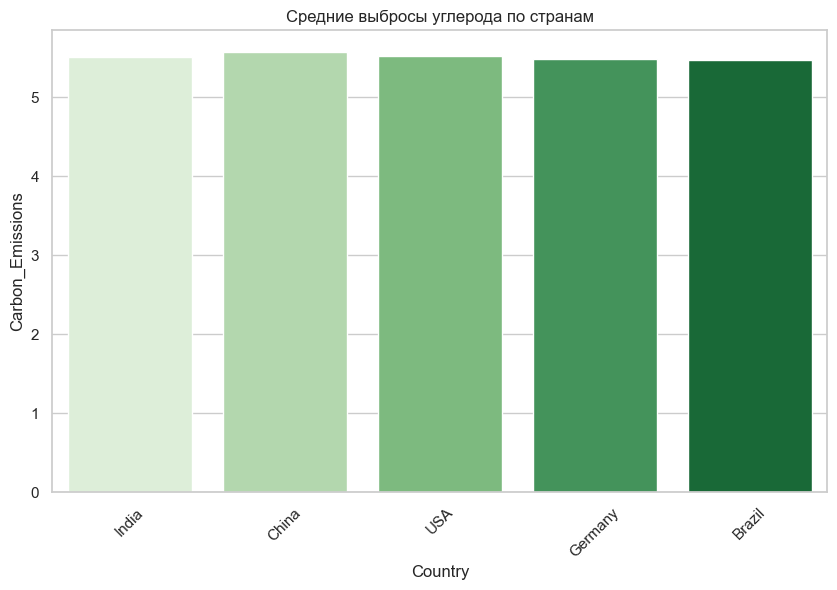

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.barplot(
    data=raw_data,
    x='Country',
    y='Carbon_Emissions',
    estimator='mean',
    errorbar=None,      # заменяет ci=None
    hue='Country',      # нужно указать hue, чтобы не ругался на palette
    legend=False,
    palette='Greens'
)
plt.title('Средние выбросы углерода по странам')
plt.xticks(rotation=45)
plt.show()

Ключевые наблюдения:
1. Нет значимых экологических различий
* Все страны работают в одинаковом диапазоне технологий и сырья.
2. Бразилия - чуть "грязнее"
* Возможно, больше кукурузы vs. тростника, или менее эффективные заводы.
* Но разница слишком мала, чтобы делать выводы.
3. Индия - чуть "чище"
* Может быть связано с сырьём (тростник, отходы), но не критично.
4. График - иллюзия различий
* Разница в 0.6 - в пределах шума при равномерном распределении (1–10).
* Не совсем отражает реальность: в жизни Бразилия (тростник) - чище США (кукуруза).

# Попарное распределение

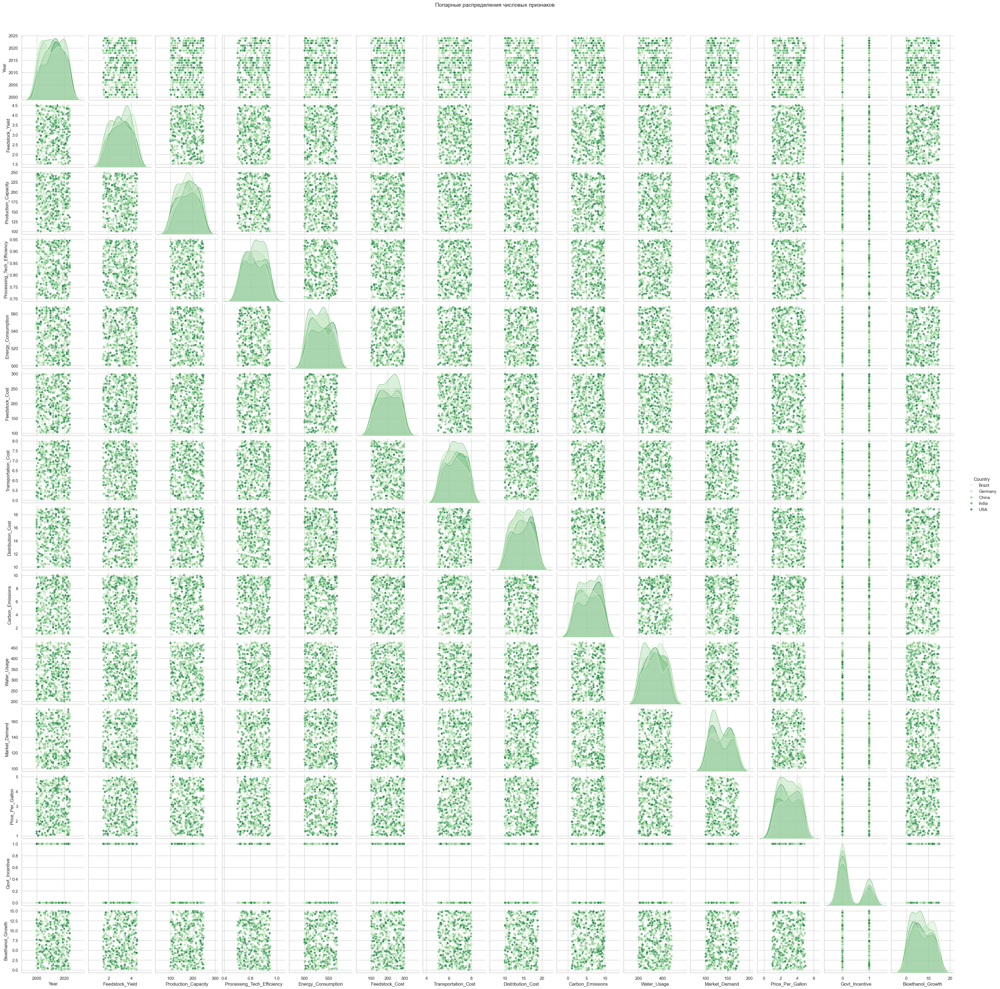

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# выбираем только числовые признаки
numeric_cols = raw_data.select_dtypes(include=['float64', 'int64']).columns

# строим попарные распределения (pairplot)
sns.pairplot(
    raw_data.sample(500, random_state=42),
    diag_kind="kde",        # на диагонали KDE-графики (плавные гистограммы)
    hue="Country",          # разные страны — разными оттенками
    palette="Greens",       # оттенки зелёного
    plot_kws={"alpha": 0.7} # немного прозрачности для наглядности
)

plt.suptitle("Попарные распределения числовых признаков", y=1.02, fontsize=14)
plt.show()

# Динамический график

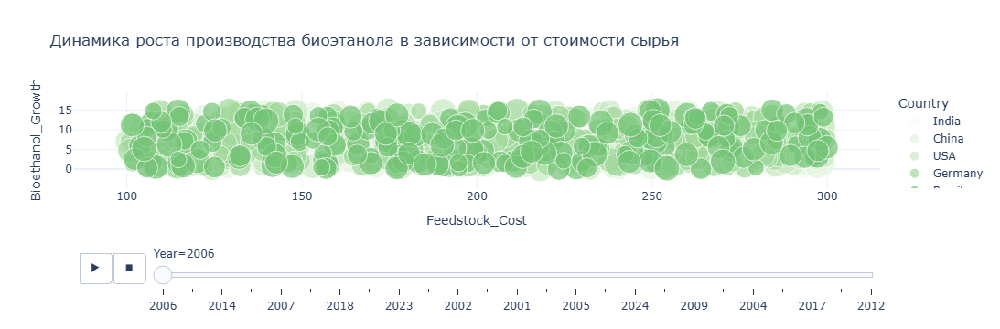

In [1]:
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd

FILE_ID = "1odXw81javPy4RwmYhj4IZts80g-3rMOv"
file_url = f"https://drive.google.com/uc?id={FILE_ID}"
raw_data = pd.read_csv(file_url)

# Пример: динамическая визуализация зависимости роста производства биоэтанола от стоимости сырья по годам
fig = px.scatter(
    raw_data,
    x="Feedstock_Cost",
    y="Bioethanol_Growth",
    animation_frame="Year",          # динамика по годам
    color="Country",                 # различие по странам
    size="Production_Capacity",      # размер точки — мощность производства
    hover_name="Country",
     color_discrete_sequence=px.colors.sequential.Greens,  # зелёная гамма
    title="Динамика роста производства биоэтанола в зависимости от стоимости сырья"
)

fig.update_layout(template="plotly_white")
fig.show()